# The aim of this notebook is to create a pipeline that detect the lane lines on the road. 

## Outline:

* Camera calibration
    * Camera Matrix
    * Distortion coefficients
    * Undistort frames
* Apply thresholds based gradient and color spaces
    * Sobel gradient thresholds
    * HSL color space thresholds.
* Apply perspective transform
    * Select 4 source points
    * select 4 desired points
    * Apply perspective transform preferably using an image of straight lines
* Line detection:
    * Histogram peaks
    * Sliding windows
    * Radius of curvature
    * Real-world data conversion
    

In [1]:
# importing all libraries used in this project
import numpy as np
import helpers
import cv2
import glob
import matplotlib
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
%reload_ext autoreload
%autoreload 2

## Camera calibration

* For this project we are going to use a chessboard of 6 rows x 9 columns as shown below:
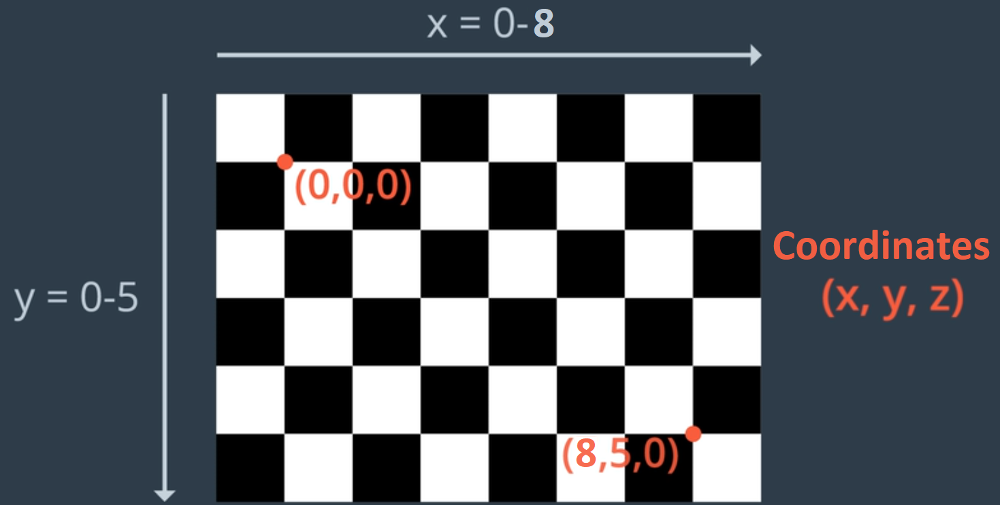

#### Getting object points and image points from chessboard images

In [2]:
def get_objP_imgP_from_chessboards(images, No_inner_rows, No_inner_cols):
    """
        This function gets the object points and image points from calibration images
        
        @param path_to_calib_imgs: path to calibration images
        @param No_inner_rows: Number of inner rows in our chessboard
        @param No_inner_cols: Number of inner columns in our chessboard
        
        @return: arrays of object points and image points 
    """
    
    ## These two lines create object points (3D points real-world) 
    # We assume that each square measures 1 unit to simplify coordinates 
    objp = np.zeros((No_inner_rows*No_inner_cols, 3), np.float32)
    objp[:,:2] = np.mgrid[0:No_inner_cols, 0:No_inner_rows].T.reshape(-1,2) # 3D points in real world space
    
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane.
    
       
    # Step through all the images to store objpoints and imgpoints
    for idx, currImg in enumerate(images):
        img = cv2.imread(currImg)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (No_inner_cols, No_inner_rows), None)
        
        # If found, add object points, image points
        if ret == True:
            corners = corners.reshape(-1,2)
            objpoints.append(objp)
            imgpoints.append(corners)
    
    return objpoints, imgpoints

In [3]:
## Testing "get_objP_imgP_from_chessboards" function
# Make a list of calibration images
path_to_calib_imgs = 'camera_cal/*.jpg'
images = glob.glob(path_to_calib_imgs)
objpoints, imgpoints = get_objP_imgP_from_chessboards(images, No_inner_rows=6, No_inner_cols=9)
# We will see the 1st image list of obj and img points for illustration purposes
pd.DataFrame(np.concatenate((objpoints[1], imgpoints[1]), axis=1), columns=["3D_X","3D_Y", "3D_Z", "2D_X", "2D_Y"])

,3D_X,3D_Y,3D_Z,2D_X,2D_Y
0,0.0,0.0,0.0,99.223198,269.600433
1,1.0,0.0,0.0,119.559486,268.014557
2,2.0,0.0,0.0,140.105621,266.096405
3,3.0,0.0,0.0,161.325378,264.462067
4,4.0,0.0,0.0,183.273041,262.506409
5,5.0,0.0,0.0,206.090988,260.303864
6,6.0,0.0,0.0,230.661911,258.206787
7,7.0,0.0,0.0,256.188324,256.335999
8,8.0,0.0,0.0,282.200348,254.348099
9,0.0,1.0,0.0,100.640938,303.316742


### Getting camera matrix & distortion coefficients

In [4]:
def get_mtx_and_distCoeff(path_to_calib_imgs, No_inner_rows, No_inner_cols):
    """
        This function gets the camera matrix (mtx) and the distortion coefficients (distCoeffs)
    """
    # Make a list of calibration images
    images = glob.glob(path_to_calib_imgs)
    # Getting image size from 1ST image (assuming all images have the same shape)
    img = cv2.imread(images[1])
    img_size = (img.shape[1], img.shape[0])
    # get object points and image points
    objpoints, imgpoints = get_objP_imgP_from_chessboards(images, No_inner_rows, No_inner_cols)
    # get camera matrix and distortion coefficients
    ret, mtx, distCoeffs, _, _ = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    if ret:
        # Store the results in a dictionary
        calib_features_dict = {'mtx':mtx, 'distCoeffs':distCoeffs}
        return calib_features_dict
    else:
        return -1
    

In [5]:
path_to_calib_imgs = "camera_cal/*.jpg"
calib_features_dict = get_mtx_and_distCoeff(path_to_calib_imgs, 6, 9)
print(f" Camera matrix = {calib_features_dict['mtx']} \n\n Distortion Coefficients = {calib_features_dict['mtx']}")

 Camera matrix = [[1.15777930e+03 0.00000000e+00 6.67111056e+02]
 [0.00000000e+00 1.15282291e+03 3.86128936e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] 

 Distortion Coefficients = [[1.15777930e+03 0.00000000e+00 6.67111056e+02]
 [0.00000000e+00 1.15282291e+03 3.86128936e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


### Undistort image function

In [6]:
def undist_img(img, mtx, distCoeffs, visualize = False):
    """
        This function undistortes an image based on the camera matrix (mtx) and the distortion coefficients (distCoeffs)
    """
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undist_img = cv2.undistort(img, mtx, distCoeffs, None, mtx)
    if visualize:
        # Visualize undistortion
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,20))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(undist_img)
        ax2.set_title('Undistorted Image', fontsize=30)
    return undist_img

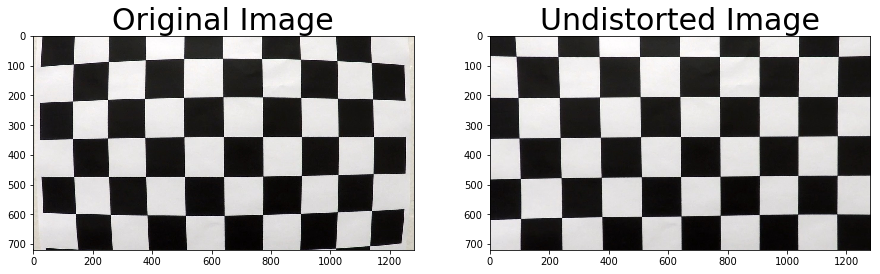

In [7]:
## Testing "undist_img" function 
# we will use the disctionary got from above section
img = cv2.imread('camera_cal/calibration1.jpg')
undst_img = undist_img(img, calib_features_dict['mtx'], calib_features_dict['distCoeffs'], visualize=True)

## HLS extraction

In [8]:
def HLS_extraction(img, channel='sat'):
    """
        This function aims to filter all pixels that are in certain threshold for one of the
            specific features in HSL color space. 
    """
    # 1) Convert to HLS color space
    hls_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    if channel == 'hue':
        ch = hls_img[:,:,0]
    elif channel == 'light':
        ch = hls_img[:,:,1]
    elif channel == 'sat':
        ch = hls_img[:,:,2]

    return ch

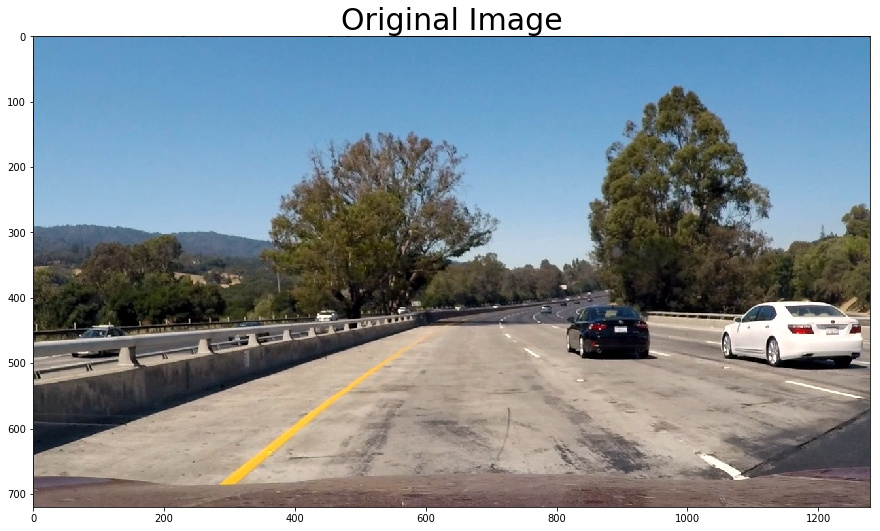

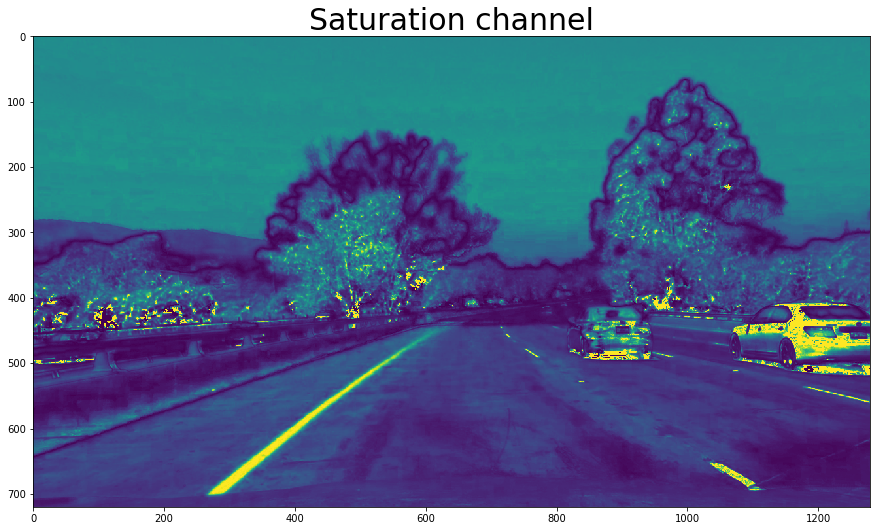

In [9]:
## Testing HLS threshold function
# Read in an image
image = cv2.imread('test_images/test1.jpg')
# undistort image based on mtx and distCoeff found in the previous section
undst_img = undist_img(image, calib_features_dict['mtx'], calib_features_dict['distCoeffs'], visualize=False)
# get binary image from the saturation channel in HLS
sat_undst_img = HLS_extraction(undst_img, channel='sat')
# Plot the result
plt.figure(1, figsize=(15,15))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=30)
plt.figure(2, figsize=(15,15))
plt.imshow(sat_undst_img)
plt.title('Saturation channel', fontsize=30);

## Gradient threshold 

* In this section we will use the saturation channel from HSL as a starting point for applying gradient thresholds

### Sobel gradient
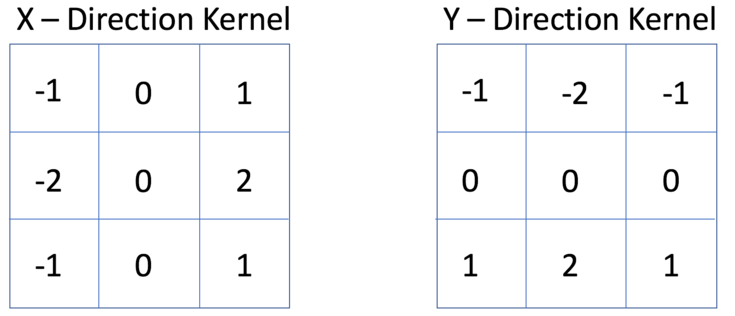
* The image above show an example of 3x3 sobel kernels used to get the gradient of an image

In [10]:
def sobel_gradient(img, orient='x', kernel_size=3):
    """
        This function applies Sobel gradient x or y, 
        Note: calling your function with orient='x' or orient='y'
        Note: The higher the kernel size the lesser the image noise. However, the cost 
                is that it will also blur the edges. 
    """
    # Is it a 2D img or a 3D image?
    dim_img = len(img.shape)
    # Apply the following steps to img
    # 1) Convert to grayscale
    if dim_img == 2:
            gray_img = img
    elif dim_img == 3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        return -1
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray_img, ddepth=cv2.CV_64F, ksize=kernel_size, dx=1,dy=0) 
    elif orient == 'y':
        sobel = cv2.Sobel(gray_img, ddepth=cv2.CV_64F, ksize=kernel_size, dx=0,dy=1) 
    else:
        return -1
    
    return sobel

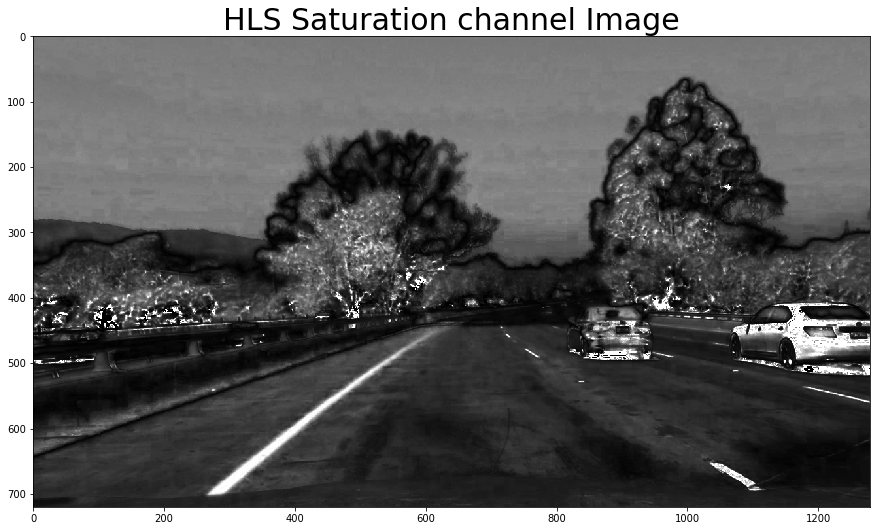

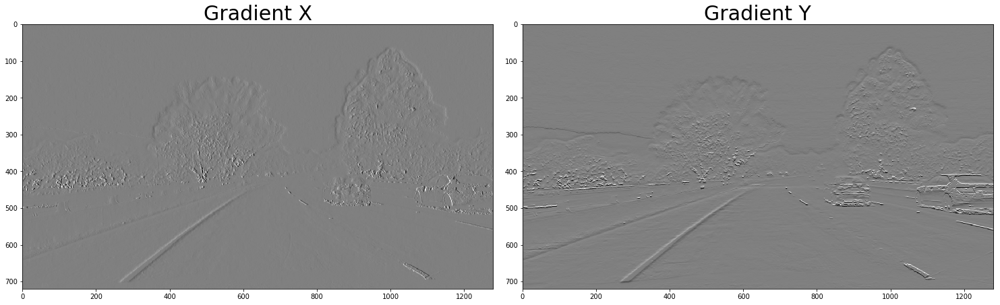

In [11]:
## Testing sobel gradient
# Read in an image // remembe that cv2.imread reads images in BGR instead of RGB
#image = cv2.imread('test_images/test1.jpg')
# Get gradient in x and y direction
Gx = sobel_gradient(sat_undst_img, orient='x', kernel_size=3)
Gy = sobel_gradient(sat_undst_img, orient='y', kernel_size=3)
# Plot the results
plt.figure(figsize=(15,15))
plt.imshow(sat_undst_img, cmap='gray')
plt.title('HLS Saturation channel Image', fontsize=30)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(Gx, cmap='gray')
ax1.set_title('Gradient X', fontsize=30)
ax2.imshow(Gy, cmap='gray')
ax2.set_title('Gradient Y', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Magnitude and orientation gradient thesholds

In [12]:
def mag_thresh(Gx, Gy, mag_thresh=(0,255)):
    """
        This function gets the magnitude of the gradient based on the previous calculations of the gradients
        in the x-direction and y-direction
    """  
    mag_G = np.sqrt(Gx**2+Gy**2)
    scaled_mag_G = np.uint8(255*mag_G/np.max(mag_G))
    binary_mask = np.zeros_like(scaled_mag_G)
    binary_mask[(scaled_mag_G >= mag_thresh[0]) & (scaled_mag_G <= mag_thresh[1])] = 1
    return binary_mask

In [13]:
def orientation_threshold(Gx, Gy, dir_thresh=(0,np.pi/2)):
    """
        This function gets the orientation of the gradient based on the previous calculations of the gradients
        in the x-direction and y-direction
    """

    # Important to denote that in the below line 
    # we are taking the absolute gradient of both Gx & Gy because we want to take into account 
    #    only values between 0 and pi/2
    # The reason is we want to threshold orientations in an easier manner. 
    # If we want a better and more detailed thresholding we should remove the absolute functions  
    orient_G = np.arctan2(np.absolute(Gy),np.absolute(Gx)) 
    #binary mask
    binary_mask = np.zeros_like(orient_G)
    binary_mask[(orient_G >= dir_thresh[0]) & (orient_G <= dir_thresh[1])] = 1 
    return binary_mask

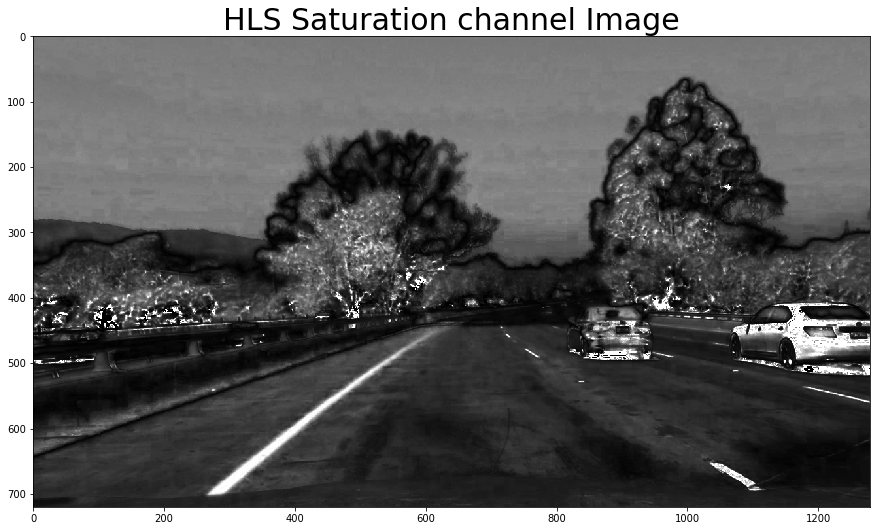

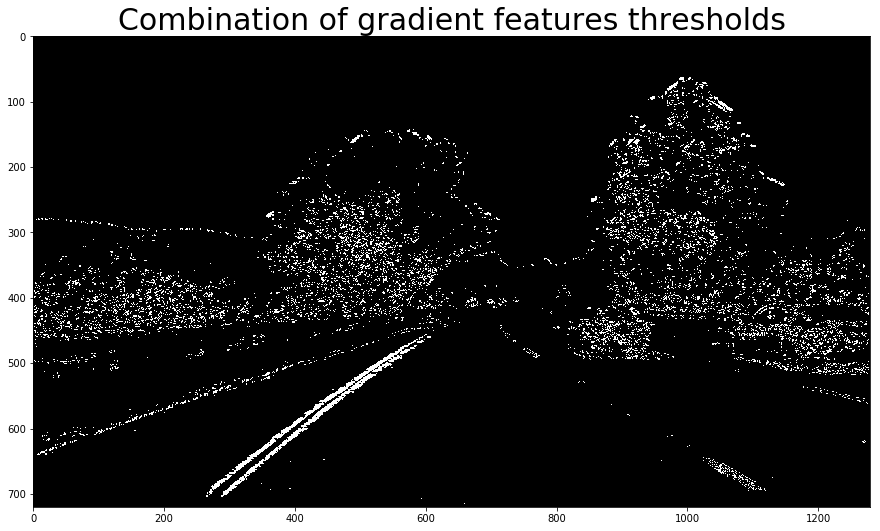

In [14]:
## Testing sobel gradient
# Use S channel undistorted image
# Get gradient in x and y direction
Gx = sobel_gradient(sat_undst_img, orient='x', kernel_size=3)
Gy = sobel_gradient(sat_undst_img, orient='y', kernel_size=3)
# Combination of gradient features
orient_grad = orientation_threshold(Gx, Gy, dir_thresh=(0.7, 1.3))
mag_grad = mag_thresh(Gx, Gy, mag_thresh=(20,100))
combined_grad = (mag_grad==1) & (orient_grad==1)
## ploting result
plt.figure(1, figsize=(15,15))
plt.title('HLS Saturation channel Image', fontsize=30)
plt.imshow(sat_undst_img, cmap='gray')
plt.figure(2, figsize=(15,15))
plt.title('Combination of gradient features thresholds', fontsize=30)
plt.imshow(combined_grad, cmap='gray');

## Masking the area of interest

In [15]:
def area_of_interest_mask(image, binaryImg=True):
    """
        This function returns an area of interest based on a trapezoid field
    """
    imshape = image.shape
    vertices = np.array([[(100,imshape[0]),(600, 420), (700, 420), (imshape[1],imshape[0])]], dtype=np.int32)
    masked_img = helpers.region_of_interest(image, vertices);
    if binaryImg:
        binary_mask = np.copy(masked_img)
        binary_mask[masked_img!=0]=1
        return binary_mask
    else:
        return masked_img

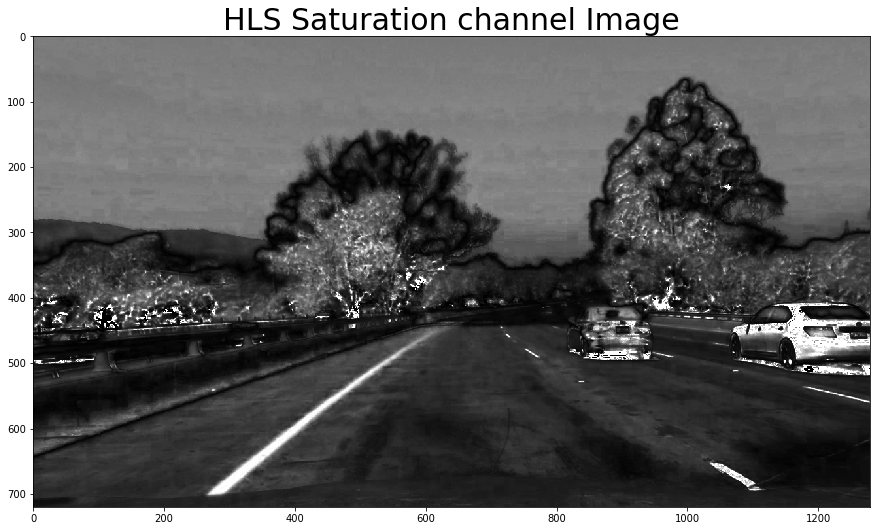

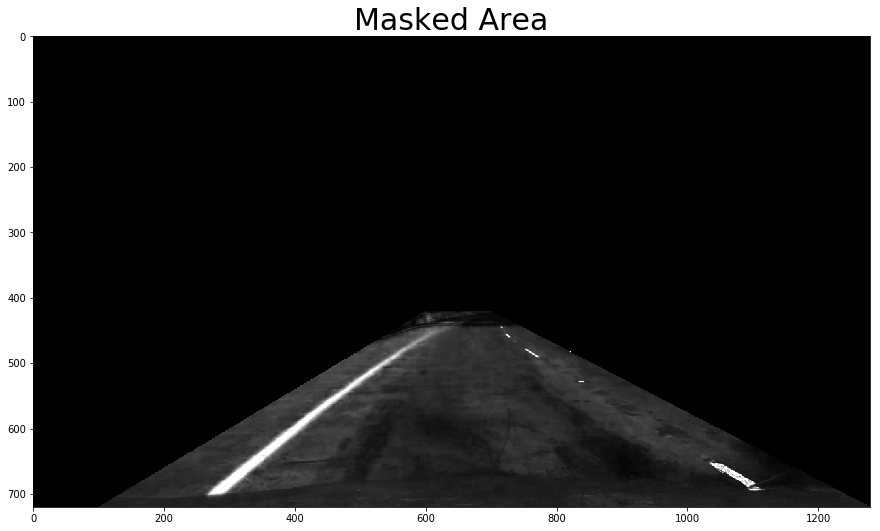

In [16]:
## Testing Masking
mask = area_of_interest_mask(sat_undst_img, binaryImg=False)
plt.figure(1, figsize=(15,15))
plt.title('HLS Saturation channel Image', fontsize=30)
plt.imshow(sat_undst_img, cmap='gray')
plt.figure(2, figsize=(15,15))
plt.title('Masked Area', fontsize=30)
plt.imshow(mask, cmap='gray');

## Testing color + gradient Threshold + trapezoid mask on all the testing images

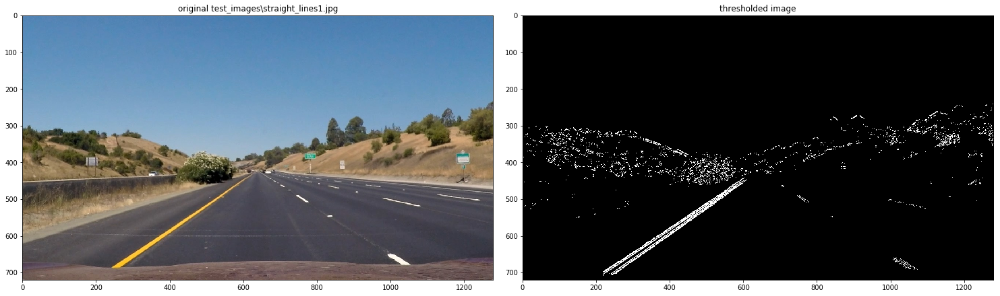

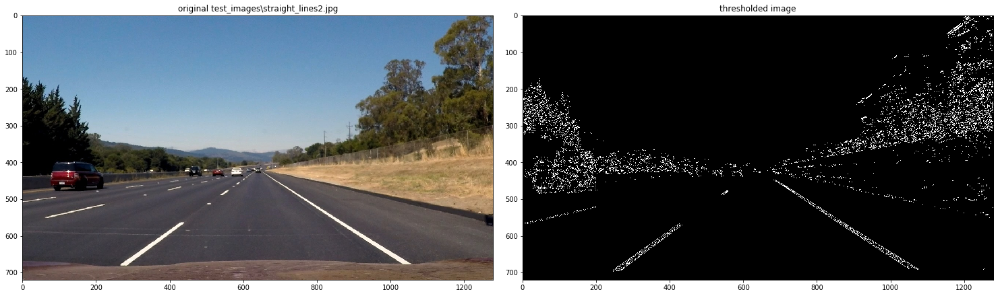

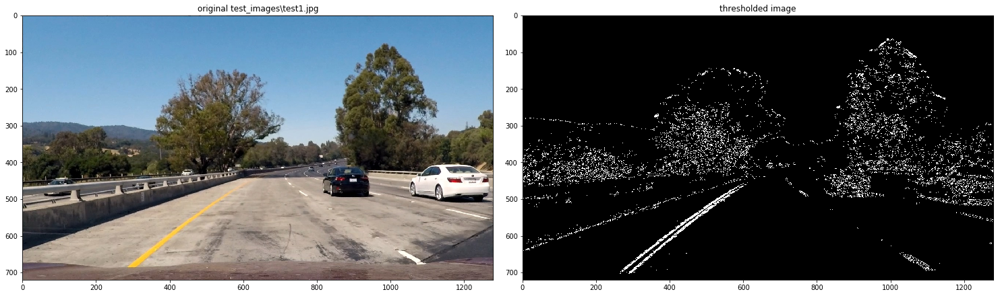

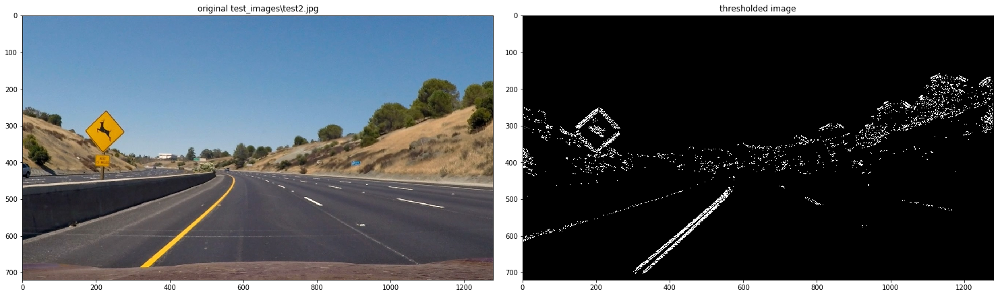

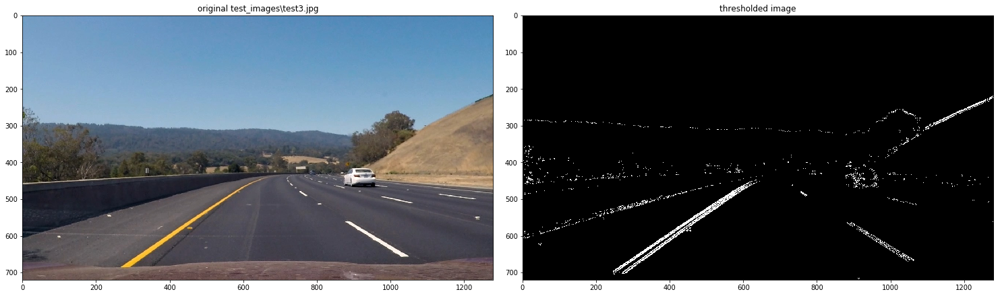

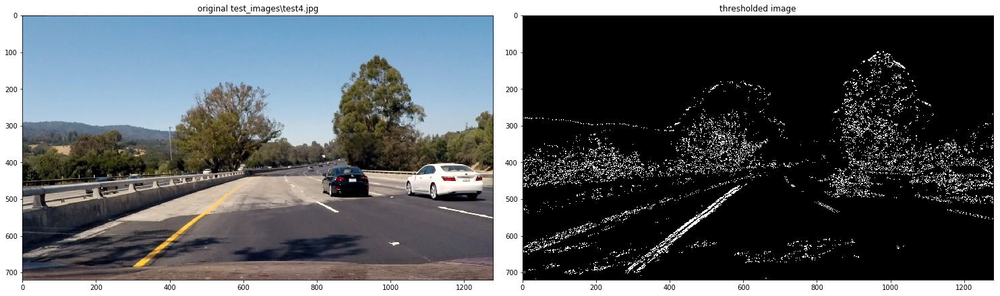

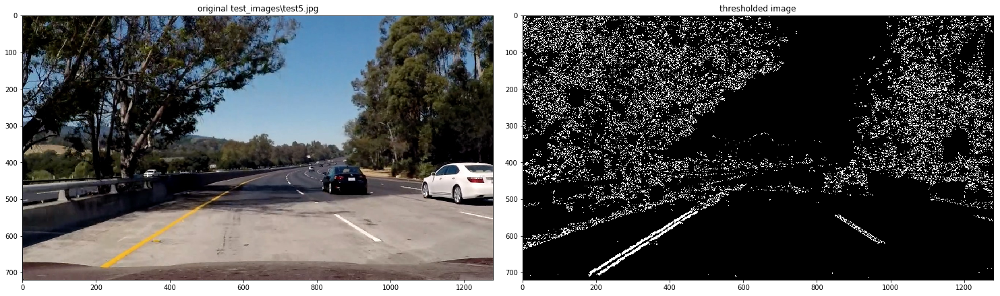

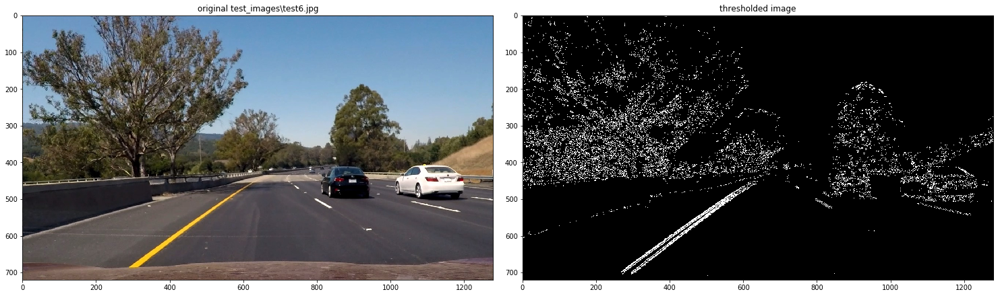

In [17]:
def testing_Color_plus_gradient_thresh(image, channel, mtx, distCoeffs, orient_thresh=(0.7, 1.3), mag_threshold=(20,150)):
    # undistort image based on mtx and distCoeff found in the previous section
    undst_img = undist_img(image, mtx, distCoeffs, visualize=False)
    # get image from the saturation channel in HLS
    sat_undst_img = HLS_extraction(undst_img, channel=channel)
    # Use S channel undistorted image
    # Get gradient in x and y direction
    Gx = sobel_gradient(sat_undst_img, orient='x', kernel_size=3)
    Gy = sobel_gradient(sat_undst_img, orient='y', kernel_size=3)
    # Combination of gradient features
    orient_grad = orientation_threshold(Gx, Gy, dir_thresh=(orient_thresh[0],orient_thresh[1]))
    mag_grad = mag_thresh(Gx, Gy, mag_thresh=(mag_threshold[0], mag_threshold[1]))
    masked_image = area_of_interest_mask(sat_undst_img)
    combined_grad = (mag_grad==1) & (orient_grad==1) #& (masked_image==1)
    return combined_grad

# Make a list of calibration images
path_to_calib_imgs = 'test_images/*.jpg'
images = glob.glob(path_to_calib_imgs)
for i, currImg in enumerate(images):
    img = cv2.imread(currImg)
    out_img = testing_Color_plus_gradient_thresh(img,'sat', 
                                                 calib_features_dict['mtx'], calib_features_dict['distCoeffs'])
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title(f'original {currImg}')
    ax2.imshow(out_img, cmap='gray')
    ax2.set_title('thresholded image')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

## Perspective transform

* In this section we will transform the images perspective to a top-down view

In [18]:
def draw_points_on_img(img, points):
    """
            In this function we aim to draw the coordinates of 4 points on the image. This will allow us to 
        visualize the points we want to select for our perspective transform
    """

    points = points.reshape(1,4,2)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.polylines(img, points, True, (255,0,0), 2)
    plt.figure(figsize=(15,15))
    plt.imshow(img)

#### Selecting the source points visually

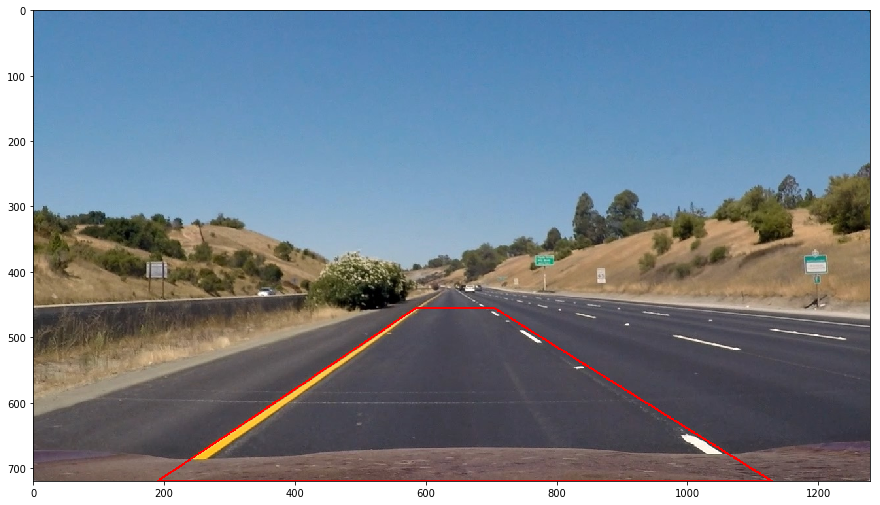

In [19]:
# Read in an image
image = cv2.imread('test_images/straight_lines1.jpg')
points = np.array([[190,image.shape[0]],[585,455],[705,455],[1130,image.shape[0]]])
draw_points_on_img(image, points)

In [20]:
def find_top_down_perspective_transform_matrix(image, inverse=False, visualize=False):
    """
        Returns the perspective transform_matrix
    """
    img_size = (image.shape[1], image.shape[0]) # getting image size
    # Define 4 source points src = np.float32([[,],[,],[,],[,]])
    left_top_corner = [585, 455]
    right_top_corner = [705, 455]
    left_bot_corner = [190, img_size[1]]
    right_bot_corner = [1130, img_size[1]]
    src = np.float32([left_top_corner, right_top_corner, left_bot_corner, right_bot_corner])
    # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    # since we don't know the exact location we can find it visuallly
    # To do this we will set a rectangle modified by an offset
    offset = 250; #pixels
    img_leftTop_corner = [offset, 0]
    img_rightTop_corner = [img_size[0]-offset, 0]
    img_leftBot_corner = [offset, img_size[1]]
    img_rightBot_corner = [img_size[0]-offset, img_size[1]]

    dst = np.float32([img_leftTop_corner,img_rightTop_corner,img_leftBot_corner,img_rightBot_corner])

    if inverse:
        # get the inverse matrix
        perspective_M = cv2.getPerspectiveTransform(dst, src)
    else:
        # use cv2.getPerspectiveTransform() to get M, the transform matrix
        perspective_M = cv2.getPerspectiveTransform(src, dst)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, perspective_M,img_size)
    
    if visualize: 
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title(f'original image', fontsize=30)
        ax2.imshow(warped)
        ax2.set_title('warped image', fontsize=30)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)   
    return perspective_M

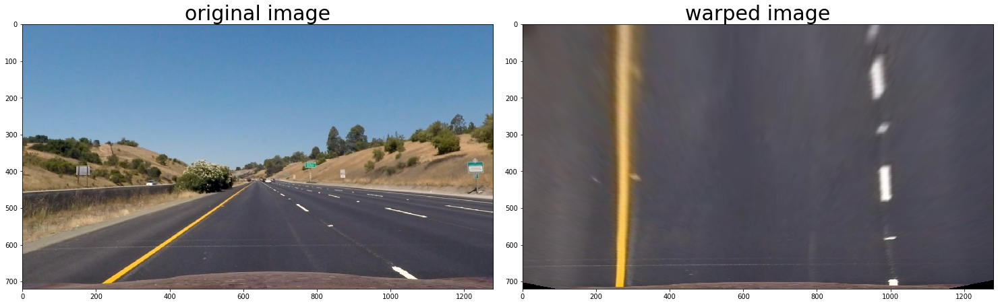

In [21]:
# Read in an image
image = cv2.imread('test_images/straight_lines1.jpg')
undst_img = undist_img(image, calib_features_dict['mtx'], calib_features_dict['distCoeffs'], visualize=False)
perspective_M = find_top_down_perspective_transform_matrix(undst_img, visualize=True)
inv_perspective_M = find_top_down_perspective_transform_matrix(undst_img, inverse=True, visualize=False)

In [22]:
def transform_to_bird_view(image, perspective_M, visualize=False):
    # getting image size
    img_size = (image.shape[1], image.shape[0]) 
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, perspective_M, img_size)
    if visualize:
        ## plotting results
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
        f.tight_layout()
        ax1.imshow(image)
        ax1.set_title(f'source image', fontsize=30)
        ax2.imshow(warped)
        ax2.set_title('warped image', fontsize=30)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
    return warped

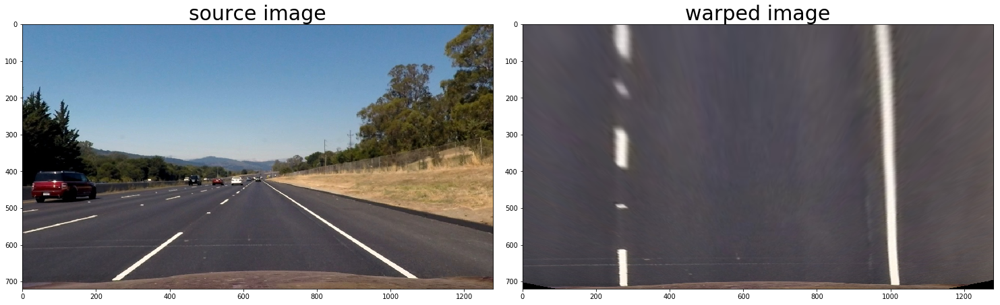

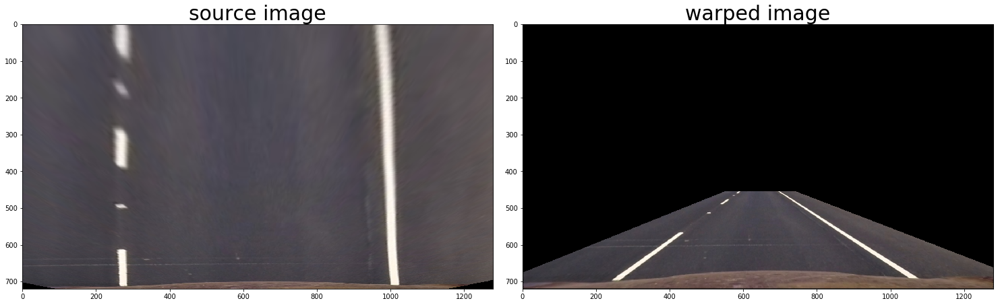

In [23]:
## testing transform_to_bird_view function
# Read in an image
image = cv2.imread('test_images/straight_lines2.jpg')
undst_img = undist_img(image, calib_features_dict['mtx'], calib_features_dict['distCoeffs'], visualize=False)
bird_view_image = transform_to_bird_view(undst_img, perspective_M, visualize=True)
inv_bird_view_image = transform_to_bird_view(bird_view_image, inv_perspective_M, visualize=True)



####  testing warped images

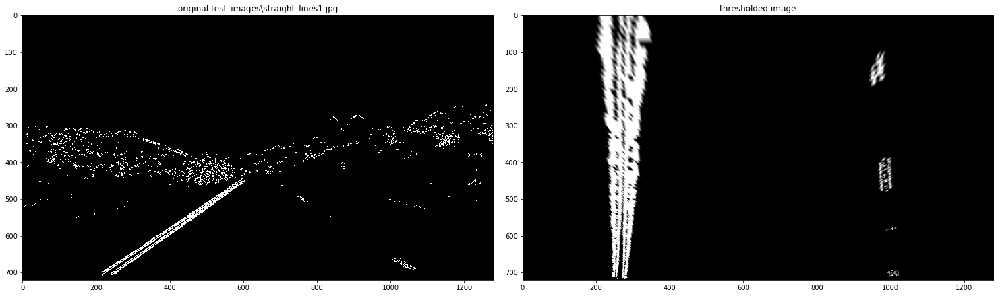

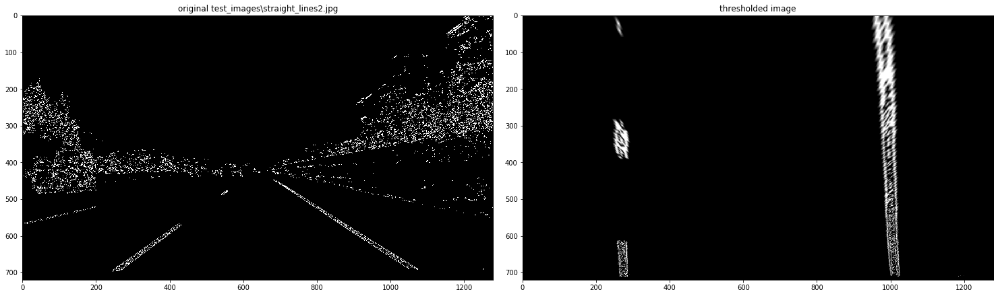

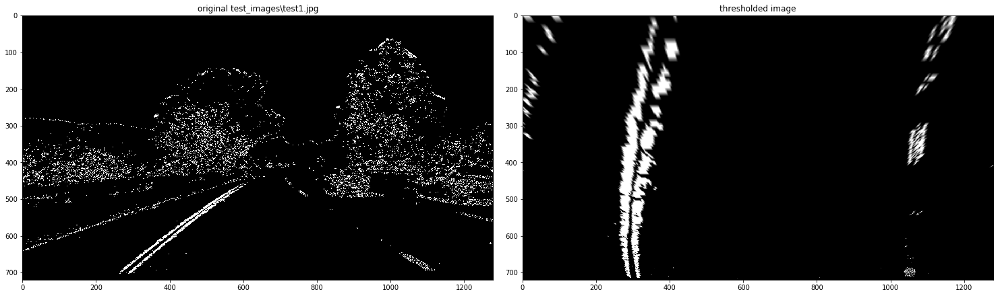

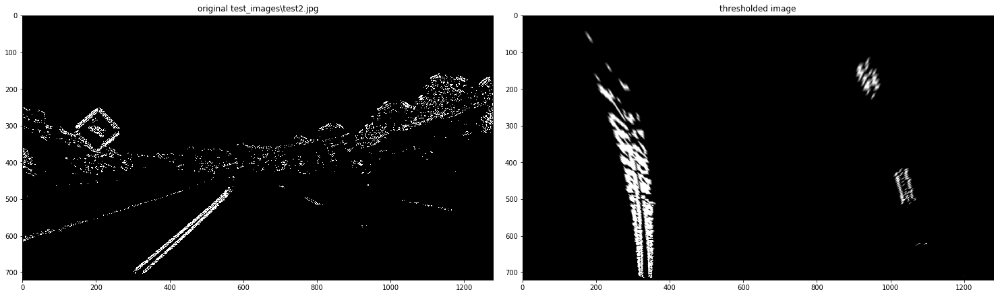

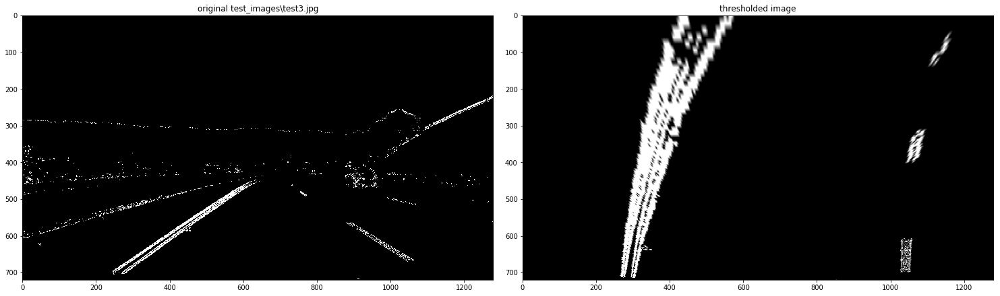

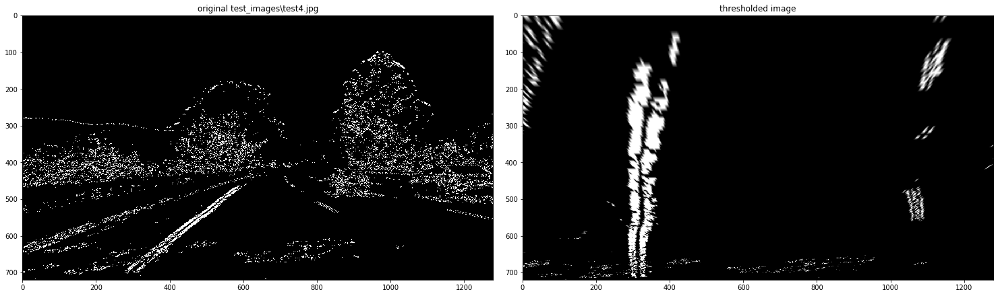

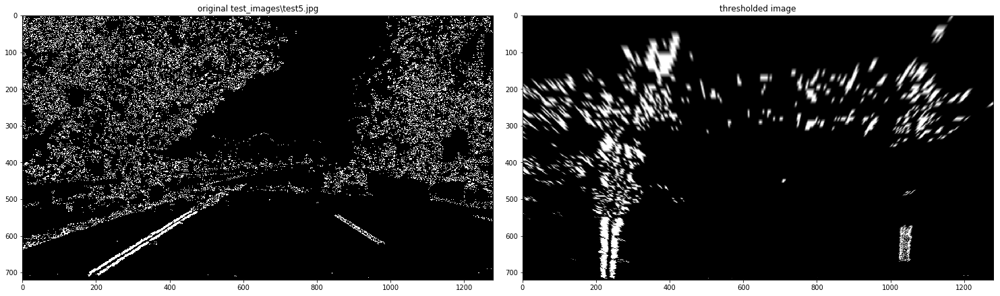

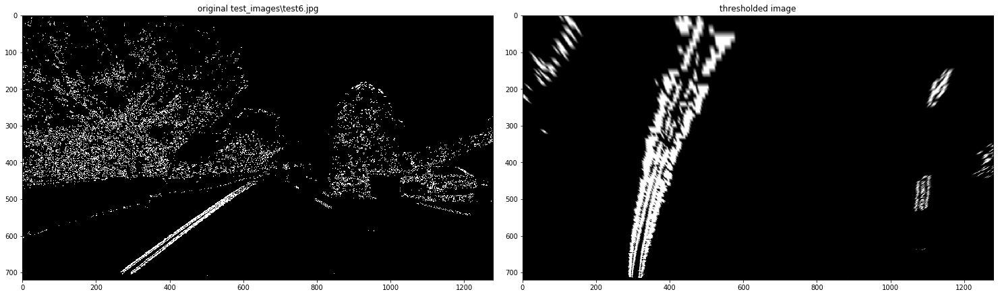

In [24]:
# Make a list of calibration images
path_to_calib_imgs = 'test_images/*.jpg'
images = glob.glob(path_to_calib_imgs)
for i, currImg in enumerate(images):
    img = cv2.imread(currImg)
    out_img = testing_Color_plus_gradient_thresh(img,'sat', 
                                                 calib_features_dict['mtx'], calib_features_dict['distCoeffs'])
    stack_out_img = (np.dstack((out_img, out_img, out_img))*255).astype(np.uint8)
    bird_view_img = transform_to_bird_view(stack_out_img, perspective_M)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(out_img, cmap='gray')
    ax1.set_title(f'original {currImg}')
    ax2.imshow(bird_view_img, cmap='gray')
    ax2.set_title('thresholded image')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)   

## Finding lines

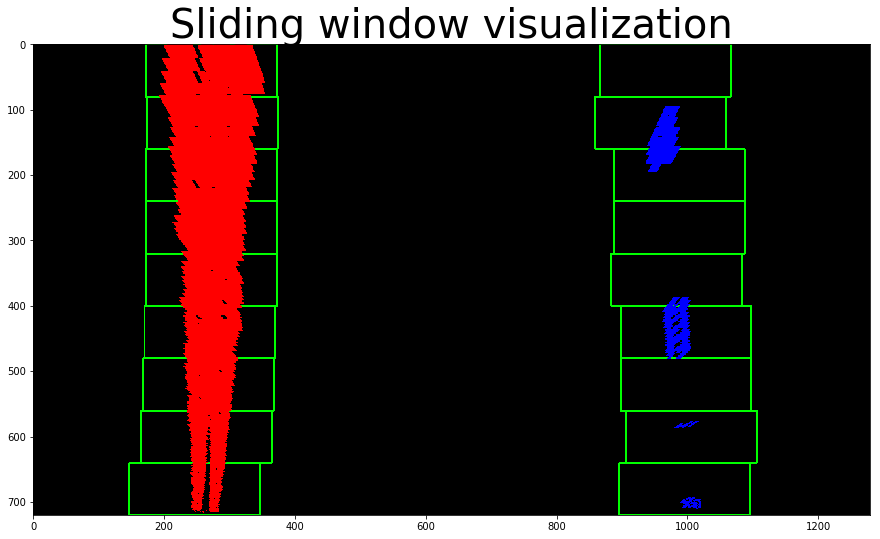

In [25]:
image = cv2.imread('test_images/straight_lines1.jpg')
out_img = testing_Color_plus_gradient_thresh(image,'sat', 
                                                 calib_features_dict['mtx'], calib_features_dict['distCoeffs'])
stack_out_img = (np.dstack((out_img, out_img, out_img))*255).astype(np.uint8)
bird_view_img = transform_to_bird_view(stack_out_img, perspective_M)
bird_view_img = cv2.cvtColor(bird_view_img, cv2.COLOR_RGB2GRAY)
left_posX, left_posY, right_posX, right_posY, out_img = helpers.sliding_windows(bird_view_img, 9, 100, 50, visualize=True)
out_img[left_posY, left_posX] = [255, 0 , 0] # Setting all pixels in left windows as red
out_img[right_posY, right_posX] = [0, 0 , 255] # Setting all pixels in left windows as blue
plt.figure(figsize=(15,15))
plt.imshow(out_img);
plt.title('Sliding window visualization', fontsize=40);

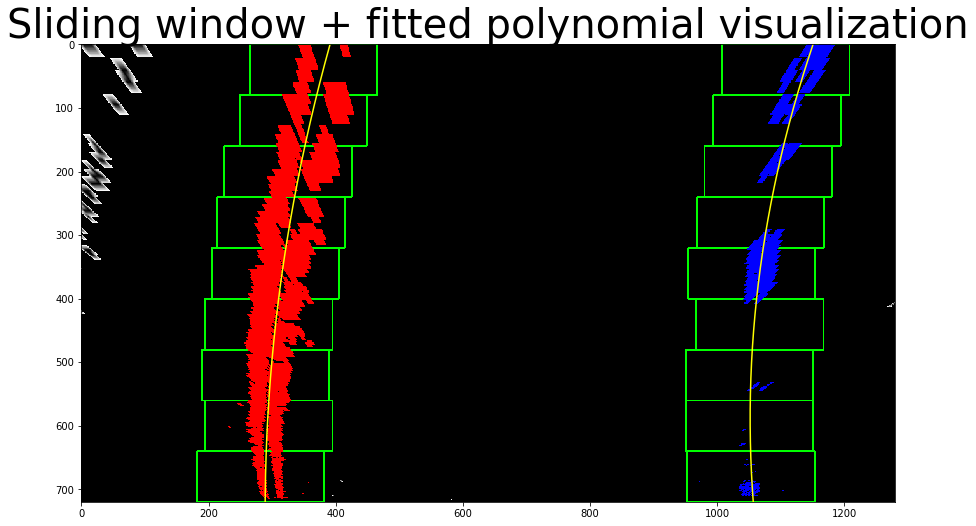

In [26]:
image = cv2.imread('test_images/test1.jpg')
out_img = testing_Color_plus_gradient_thresh(image,'sat', 
                                                 calib_features_dict['mtx'], calib_features_dict['distCoeffs'])
stack_out_img = (np.dstack((out_img, out_img, out_img))*255).astype(np.uint8)
bird_view_img = transform_to_bird_view(stack_out_img, perspective_M)
bird_view_img = cv2.cvtColor(bird_view_img, cv2.COLOR_RGB2GRAY)
helpers.fit_polynomial(bird_view_img, visualize=True);

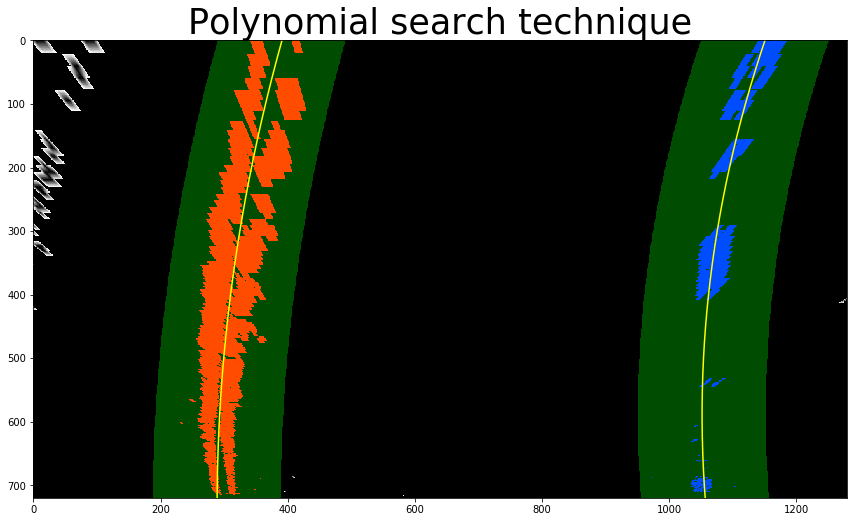

In [27]:
leftCoeff, rightCoeff = helpers.fit_polynomial(bird_view_img, visualize=False);
helpers.search_around_poly(bird_view_img, leftCoeff, rightCoeff, 100, visualize=True);

## Calculating the radius of curvature

In [28]:
leftCoeff, rightCoeff = helpers.fit_polynomial(bird_view_img, visualize=False);
# We will test with the bottom of the image
y_eval = img.shape[0]-1
left_R, right_R = helpers.measure_curvature(y_eval, leftCoeff, rightCoeff)
print(f"left_R: {left_R} [pixels], right_R: {right_R} [pixels]")

left_R: 2646.384107270609 [pixels], right_R: 1766.4945318065347 [pixels]
